In [ ]:
!unzip "drive/MyDrive/Dog_vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog_vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog_vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog_vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog_vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/Dog_visio

###Getting our workspaces ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog_vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

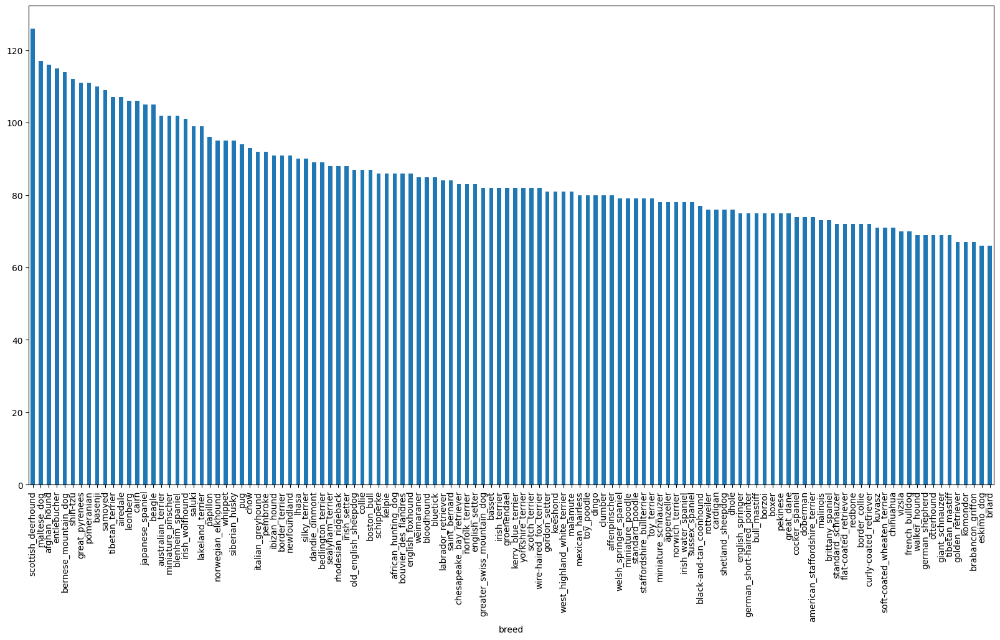

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

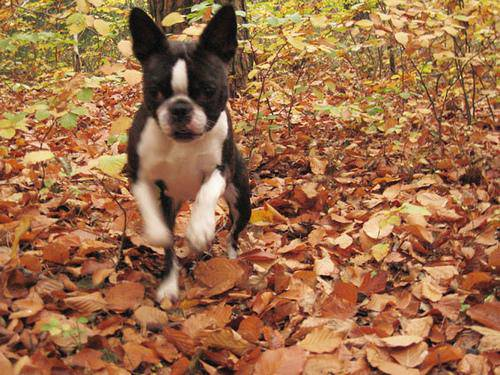

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

###Assigning Ids to Images

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["drive/MyDrive/Dog_vision/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(filenames)

10222

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog_vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


In [ ]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating Validation set

In [ ]:
X = filenames
Y = boolean_labels

In [ ]:
#shrinking the data from 10222 to 1000/(desirable number)
NUM_IMAGES = 1000 #@param {type : "slider", min:1000,max:10000,step:1000}

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_val,Y_train,Y_val = train_test_split(X[:NUM_IMAGES],Y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
len(X_train),len(Y_train),len(X_val),len(Y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2],Y_train[:2]

(['drive/MyDrive/Dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

### Preprocessing Images (Turning images into tensors)

## In the process of preprocessing the images, we do the following things in the function:
1. Give the image filepath as an input
2. Using tensorflow to read the image and save it in a variable, "image"
3. Turn images into Tensors and normalizing it.
4. resize the images to (224,224)
5. return the modified image.

In [ ]:
#reading images
from matplotlib.pyplot import imread
image = imread(filenames[124])
image.shape

(500, 349, 3)

array([[[ 57,  52,  46],
        [ 67,  62,  56],
        [ 79,  74,  68],
        ...,
        [ 85,  74,  90],
        [ 86,  75,  91],
        [ 86,  75,  92]],

       [[ 58,  53,  47],
        [ 67,  62,  56],
        [ 79,  74,  68],
        ...,
        [ 82,  71,  87],
        [ 82,  71,  87],
        [ 82,  71,  88]],

       [[ 60,  55,  49],
        [ 69,  64,  58],
        [ 80,  75,  69],
        ...,
        [ 75,  64,  80],
        [ 76,  65,  81],
        [ 77,  66,  82]],

       ...,

       [[176, 173, 168],
        [173, 170, 165],
        [165, 162, 157],
        ...,
        [189, 194, 200],
        [188, 193, 199],
        [190, 193, 200]],

       [[179, 176, 171],
        [175, 172, 167],
        [167, 164, 159],
        ...,
        [189, 194, 200],
        [187, 192, 198],
        [188, 191, 198]],

       [[179, 176, 171],
        [176, 173, 168],
        [168, 165, 160],
        ...,
        [188, 193, 199],
        [185, 190, 196],
        [186, 189, 196]]], dtype=uint8)
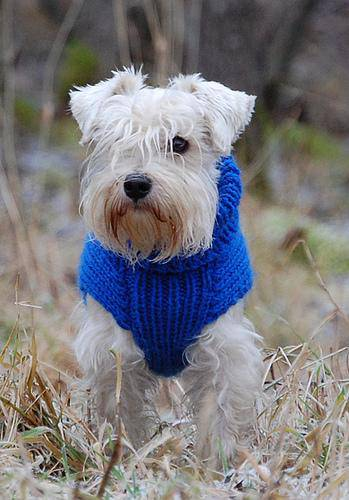

In [ ]:
image

In [ ]:
#converting image into tensor
tf.constant(image)

<tf.Tensor: shape=(500, 349, 3), dtype=uint8, numpy=
array([[[ 57,  52,  46],
        [ 67,  62,  56],
        [ 79,  74,  68],
        ...,
        [ 85,  74,  90],
        [ 86,  75,  91],
        [ 86,  75,  92]],

       [[ 58,  53,  47],
        [ 67,  62,  56],
        [ 79,  74,  68],
        ...,
        [ 82,  71,  87],
        [ 82,  71,  87],
        [ 82,  71,  88]],

       [[ 60,  55,  49],
        [ 69,  64,  58],
        [ 80,  75,  69],
        ...,
        [ 75,  64,  80],
        [ 76,  65,  81],
        [ 77,  66,  82]],

       ...,

       [[176, 173, 168],
        [173, 170, 165],
        [165, 162, 157],
        ...,
        [189, 194, 200],
        [188, 193, 199],
        [190, 193, 200]],

       [[179, 176, 171],
        [175, 172, 167],
        [167, 164, 159],
        ...,
        [189, 194, 200],
        [187, 192, 198],
        [188, 191, 198]],

       [[179, 176, 171],
        [176, 173, 168],
        [168, 165, 160],
        ...,
        [188, 193, 19

In [ ]:
#define Image size
IMG_SIZE = 224
def process_image(image_path, image_size = IMG_SIZE):

  ''' Takes image path as an input, converts into tensors, normalises it and resizes it into shape (224,224)'''

  #read an image file
  image = tf.io.read_file(image_path)
  #converting the image into tensors
  image = tf.image.decode_jpeg(image,channels =3)
  #normalizing the values of the colour channel in range of 0-1
  image = tf.image.convert_image_dtype(image,tf.float32)
  #Rsize the image to shape of (224,224)
  image = tf.image.resize(image,size = [IMG_SIZE, IMG_SIZE])

  return image

### Turning Data into batches

In [ ]:
#writing a function to return the path of the image and the label in the form of the tuple
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

In [ ]:
BATCH_SIZE = 32
#write a finction to create batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):

  '''Takes the data and creates the batches by shufflig the data if its the training data, else just creates the batches'''

  #dealing with test_data which doesn't have labels
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepahts(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #dealing with valid_data whcih has both filepaths and labels but no need to shuffle the data
  elif valid_data:
    print("Creating valid batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),#filepaths
                                               tf.constant(y)))#labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  #dealing with training data which needs to be shuffled
  else:
    print("Creating training batches...")
    #turning filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),#filepaths
                                               tf.constant(y)))#labels
    #shuffling the data
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
print(f"X_train shape: {len(X_train)}")
print(f"Y_train shape: {len(Y_train)}")

X_train shape: 800
Y_train shape: 800


In [ ]:
#create train and valid data batches
train_data = create_data_batches(X_train,Y_train)
val_data = create_data_batches(X_val,Y_val,valid_data = True)

Creating training batches...
Creating valid batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt
#creating a function to visualize the batches
def show_25_images(images,labels):

  #setup figure
  plt.figure(figsize=(10,10))

  for i in range(25):
    #create subplots
    ax = plt.subplot(5,5,i+1)
    #display an image
    plt.imshow(images[i])
    #add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid lines off
    plt.axis("off")


In [ ]:
train_images , train_labels = next(train_data.as_numpy_iterator())
val_images,val_labels = next(val_data.as_numpy_iterator())

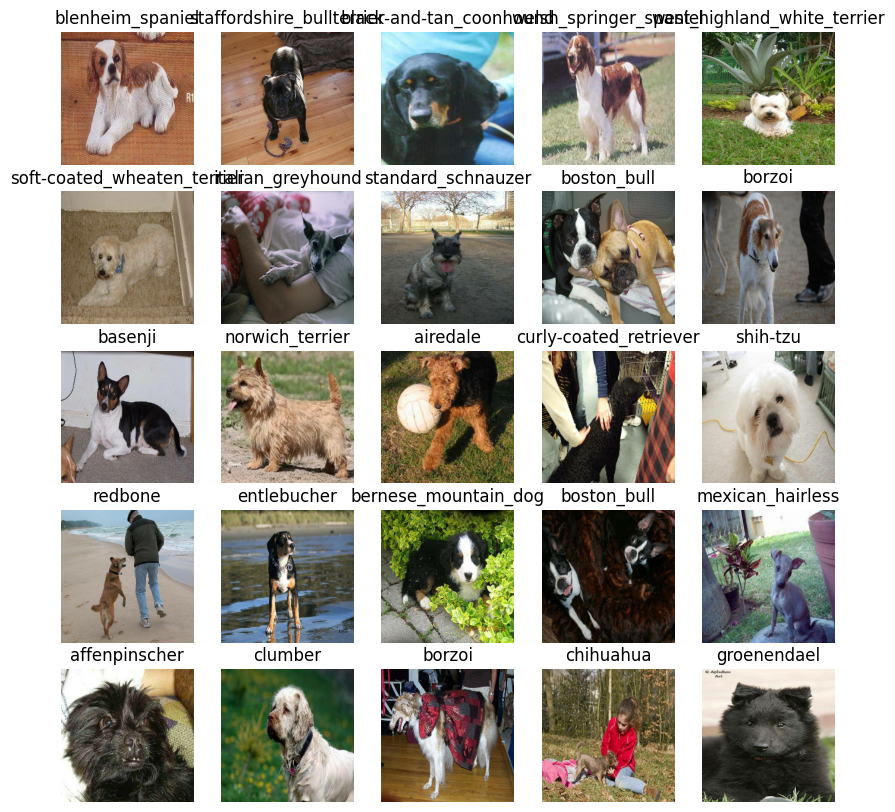

In [ ]:
#Visualising the training data
show_25_images(train_images,train_labels)

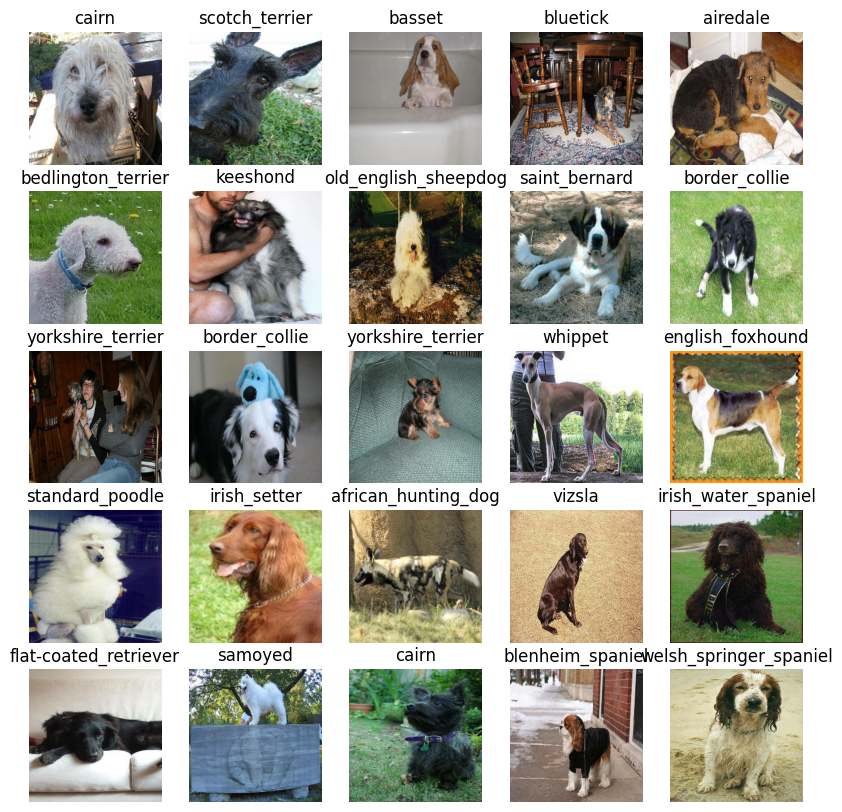

In [ ]:
#visualising the valid data set
show_25_images(val_images,val_labels)

### Building a model

In [ ]:
#setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4" #"https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [ ]:
'''#Code which was used in the course
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url, trainable=False, input_shape=input_shape[1:]),  # Layer 1 (pretrained feature extractor)
        tf.keras.layers.Dense(units=output_shape, activation="softmax")  # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),  # Loss function
        optimizer=tf.keras.optimizers.Adam(),  # Optimizer
        metrics=["accuracy"]  # Evaluation metric
    )

    return model'''

In [ ]:
#Code modified according to the discord replies
'''import tf_keras as keras
from tf_keras.models import Sequential
from tf_keras.layers import Dense

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model layers
    model = Sequential([
        hub.KerasLayer(model_url, trainable=False, input_shape=input_shape[1:]),  # Feature extractor
        Dense(units=output_shape, activation="softmax")  # Output layer
    ])

    # Compile the model
    model.compile(
        loss=keras.losses.CategoricalCrossentropy(),  # Loss function
        optimizer=keras.optimizers.Adam(),  # Optimizer
        metrics=["accuracy"]  # Evaluation metric
    )

    return model'''


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_1 (Dense)             (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:


## This is the code I used and it seems to be working

import tensorflow_hub as hub
import tensorflow as tf
import tf_keras  # ✅ Use tf_keras instead of tf.keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  hubs_layer = hub.KerasLayer(MODEL_URL, input_shape=input_shape)

    # Setup the model layers

  model = tf.keras.Sequential([

  tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)

  tf.keras.layers.Dense(units=OUTPUT_SHAPE,

                          activation="softmax") # Layer 2 (output layer)

    ])

  # Compile the model
  model.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=["accuracy"]
)

  return model

model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_1 (Lambda)                    │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
'''import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.models import Sequential
from tensorflow_hub.keras_layer import KerasLayer

#create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # Download the pretrained model and save it as a KerasLayer
  # This ensures it's loaded as a valid Keras Layer
  pretrained_model = hub.KerasLayer(model_url, trainable=False)

  #setup the model layers
  #Instead of adding the pretrained_model directly to the Sequential model,
  #create a functional model using the Keras Functional API
  input_layer = tf.keras.layers.Input(shape=input_shape[1:])

  # Wrap the pretrained_model call in a Lambda layer to handle the symbolic input
  x = tf.keras.layers.Lambda(lambda inputs: pretrained_model(inputs))(input_layer)

  output_layer = tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")(x)
  model = tf.keras.Model(inputs=input_layer, outputs=output_layer)


  #compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #build the model is not needed in functional API
  #model.build(INPUT_SHAPE)

  return model'''

In [ ]:
'''model = create_model()
model.summary()'''

'model = create_model()\nmodel.summary()'

In [ ]:
'''import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.models import Sequential
from tensorflow_hub.keras_layer import KerasLayer

#create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # Download the pretrained model and save it as a KerasLayer
  # This ensures it's loaded as a valid Keras Layer
  pretrained_model = hub.KerasLayer(model_url, trainable=False)

  #setup the model layers
  #Instead of adding the pretrained_model directly to the Sequential model,
  #create a functional model using the Keras Functional API
  input_layer = tf.keras.layers.Input(shape=input_shape[1:])

  # Wrap the pretrained_model call in a Lambda layer to handle the symbolic input
  # and specify the output shape explicitly to address the NotImplementedError
  x = tf.keras.layers.Lambda(lambda inputs: pretrained_model(inputs), output_shape=pretrained_model.compute_output_shape(input_layer.shape))(input_layer)

  output_layer = tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")(x)
  model = tf.keras.Model(inputs=input_layer, outputs=output_layer)


  #compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  return model

model = create_model()
model.summary()'''

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, None, 1001)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, None, 120)           │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

### Creating callbacks
We create two callbacks, one for tracking the progress of our model and another for stopping the model if it is training for too long.

## Tensorboard callback
To create tensorboard callback, we do the following things:
1. Load tensorboard callback extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's fit() function
3. Visualise our model's training logs with %tensorboard magic function

In [ ]:
#Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog_vision/logs",
                        #make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

###Early stopping callback

In [ ]:
#create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

###Training a model(on subset of our data)

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10,max:100,step:10}

In [ ]:
import os
#Build a function to train a model and return the trained model
def train_model():

  #create model
  model = create_model()

  #create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the mdoel to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #return the fitted model
  return model

In [ ]:
#fit the model
model = train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 165s 6s/step - accuracy: 0.0526 - loss: 4.8529 - val_accuracy: 0.3000 - val_loss: 3.2811
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.6627 - loss: 2.0893 - val_accuracy: 0.5600 - val_loss: 2.0820
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9305 - loss: 0.8214 - val_accuracy: 0.6300 - val_loss: 1.6155
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.9832 - loss: 0.4074 - val_accuracy: 0.6500 - val_loss: 1.4453
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.9911 - loss: 0.2601 - val_accuracy: 0.6750 - val_loss: 1.3473
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9967 - loss: 0.1749 - val_accuracy: 0.6850 - val_loss: 1.2970
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9932 - loss: 0.1361 - val_accuracy: 0.6800 - val_loss: 1.2517
Epoch 8/100
25/25 ━━━━

In [ ]:
model

<Functional name=functional_1, built=True>

###Checking tensorboard logs

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_vision/logs

Reusing TensorBoard on port 6006 (pid 6044), started 2:02:26 ago. (Use '!kill 6044' to kill it.)

<IPython.core.display.Javascript object>

###Making predictions

In [ ]:
#make predictions on the validation data
predictions = model.predict(val_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step


array([[5.53030660e-03, 1.56162679e-03, 1.80382223e-04, ...,
        1.33309019e-04, 4.68888284e-05, 4.38033883e-03],
       [6.20862294e-04, 2.73332908e-03, 4.66317777e-03, ...,
        3.09718918e-04, 1.15530775e-03, 6.69874207e-05],
       [1.68443250e-06, 4.54733708e-05, 2.02333158e-05, ...,
        2.28011213e-05, 2.76214487e-05, 2.68648379e-04],
       ...,
       [6.13448210e-05, 6.88841799e-04, 3.52260424e-04, ...,
        4.28046005e-05, 4.73213513e-05, 2.21332724e-04],
       [7.71424529e-05, 2.00571158e-05, 5.88856237e-05, ...,
        2.93744074e-06, 1.13173555e-05, 1.03566435e-03],
       [4.53186440e-05, 1.90468563e-05, 4.12361871e-04, ...,
        2.14348151e-03, 3.28357494e-03, 2.64013419e-04]], dtype=float32)

In [ ]:
np.sum(predictions[1])

np.float32(0.9999999)

In [ ]:
#checking our predictions
index = 1
print(f"largest prediction: {np.max(predictions[index])}")
print(f"Sum of predictions: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Largest prediction class: {unique_breeds[np.argmax(predictions[index])]}")

largest prediction: 0.6990372538566589
Sum of predictions: 0.9999998807907104
Max index: 96
Largest prediction class: scotch_terrier


In [ ]:
#checking our predictions
index = 42
print(f"largest prediction: {np.max(predictions[index])}")
print(f"Sum of predictions: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Largest prediction class: {unique_breeds[np.argmax(predictions[index])]}")

largest prediction: 0.6436525583267212
Sum of predictions: 1.0000001192092896
Max index: 39
Largest prediction class: english_foxhound


Now lets write a function to convert the prediction probabilities into label

In [ ]:
def get_pred_labels(prediction_probabilities):
  pred_labels = unique_breeds[np.argmax(prediction_probabilities)]
  return pred_labels

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now we have to unbatch the validation data to compare the results of the predictions with the labels

In [ ]:
#create a function to unbatch a batch dataset
def unbatchify(data):
  "takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels"
  images = []
  labels = []
  #loop through unbatched data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

In [ ]:
#unbatchify the validation data set
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

### Visualizing the predictions

In [ ]:
#Let's write a function to visualize the image, the prediction, the correct label and the prediction probability

def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  #get the predicted label
  pred_label = get_pred_labels(pred_prob)

  #plot image and remove the ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colour of the
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #change plot title to be predicted,prediction probability,true label
  plt.title(f"pred: {pred_label}, Prob: {pred_prob[np.argmax(pred_prob)]:.2%}, True: {true_label}",color=color)


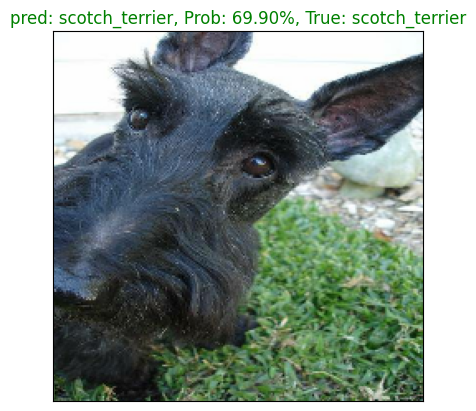

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images)

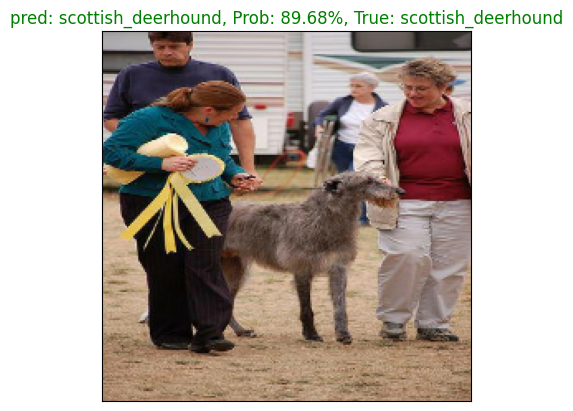

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=124)

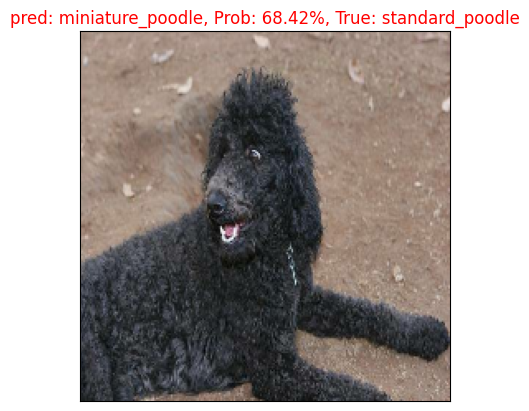

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=47)

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6873 - loss: 1.1624


[1.2306734323501587, 0.6899999976158142]

In [ ]:
batch = next(iter(val_data))  # Get one batch
images, _ = batch  # Unpack the batch to get only images
predictions = model(images)  # Test inference on images only
print(predictions)

tf.Tensor(
[[0.00472668 0.00685577 0.00174215 ... 0.0023788  0.00057937 0.00103781]
 [0.00141702 0.00043653 0.00315298 ... 0.00330826 0.00531651 0.00515153]
 [0.00165507 0.00199977 0.00215783 ... 0.0010793  0.0018782  0.00755241]
 ...
 [0.00615606 0.00016724 0.00122137 ... 0.01820228 0.01209827 0.00489833]
 [0.01858342 0.00867087 0.0008236  ... 0.00503886 0.00051687 0.00038336]
 [0.01353645 0.00036574 0.01267259 ... 0.00892944 0.0003219  0.00598052]], shape=(32, 120), dtype=float32)


In [ ]:
for batch in val_data.take(1):
    images, labels = batch
    print(images.shape, labels.shape)  # Ensure both exist

(32, 224, 224, 3) (32, 120)


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 995ms/step - accuracy: 0.0056 - loss: 5.6492


[5.713176250457764, 0.009999999776482582]

### Training on full data set

In [ ]:
len(X),len(Y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X,Y)

Creating training batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1053s 3s/step - accuracy: 0.6295 - loss: 1.5055
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 457s 1s/step - accuracy: 0.8962 - loss: 0.3564
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 448s 1s/step - accuracy: 0.9481 - loss: 0.2031
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.9744 - loss: 0.1273
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 446s 1s/step - accuracy: 0.9855 - loss: 0.0872
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 448s 1s/step - accuracy: 0.9899 - loss: 0.0641
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.9934 - loss: 0.0484
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 418s 1s/step - accuracy: 0.9965 - loss: 0.0378
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 439s 1s/step - accuracy: 0.9970 - loss: 0.0291
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 433s 1s/step - accuracy: 0.9982 - loss: 0.0252
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9991 - loss: 0.0213
Epoch 12/100
320/320 ━━━━━━━━

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2")

Saving model to: drive/MyDrive/Dog_vision/models/20250322-114824-full-image-set-mobilenetv2.keras...


'drive/MyDrive/Dog_vision/models/20250322-114824-full-image-set-mobilenetv2.keras'